# Исследование заведений общественного питания в Москве

Описание проекта:

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

В нашем распоряжени датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. На его основе будет составлена презентация по итогам анализа.

Ход исследования: 
- Обзор данных.
- Предобработка данных.
- Анализ заведений общественного питания Москвы.
- Иследование: открытие кофейни.
- Написание общего вывода.
- Презентация по итогам анализа

**Оглавление:**
1. [Открытие данных](#start)
2. [Предобработка данных](#preprocessing)
3. [Анализ данных](#analysis)
    * 3.1 [Количество объектов общественного питания по категориям](#Number_of_catering)
    * 3.2 [Количество посадочных мест объектов общественного питания по категориям](#Number_of_seats)
    * 3.3 [Соотношение сетевых и несетевых заведений по количеству](#Ratio_of_network)
    * 3.4 [Соотношение сетевых и несетевых заведений по категориям](#ratio_category)
    * 3.5 [Топ-15 популярных сетей в Москве](#Top_15_popular_networks)
    * 3.6 [Распределение категорий заведений по административным районам Москвы](#Distribution_of_categories)
    * 3.7 [Распределение средних рейтингов по категориям заведений](#Distribution_of_grades)
    * 3.8 [Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района.](#average_rating_of_establishments)
    * 3.9 [Заведения датасета на карте](#establishments_on_the_maps)
    * 3.10 [Топ-15 улиц по количеству заведений](#Top_15_streets)
    * 3.11 [Улицы с одним объектом общепита](#Streets_with_one)
    * 3.12 [Значения средних чеков заведений](#Values_of_avg_receipts)
    * [Вывод](#3_onclusion) 
4. [Иследование: открытие кофейни](#open_of_coffee)

## 1. Открытие данных
<a id="start"></a> 

In [1]:
import pandas as pd
import os
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px 
from plotly import graph_objects as go
import warnings as wr
wr.filterwarnings('ignore')
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
import json

#напишем функцию для открытия файла 
def read_file(file_name):
    path1 = os.path.join('/datasets/', file_name)
    path2 = os.path.join(file_name)
    if os.path.exists(path1):
        df=pd.read_csv(path1)
        return df
    elif os.path.exists(path2):
        df=pd.read_csv(path2)
        return df
    else:
        print('File is not found')

In [2]:
#выгрузим df
moscow_places = read_file('moscow_places.csv')

In [3]:
#напишем функцию для просмотра информации о таблице
def inf(data):
    display(data.head())
    
    #Выведем общую информацию о кол-ве и формате, количество и процент пропущенных значений для каждого столбца
    display(pd.DataFrame(
    {'count': data.count(), #кол-во данных
    'count NaNs': data.isna().sum(), #кол-во пропусков
    'NaNs,%': (round((data.isna().mean() * 100), 2)), #процент пропусков     
    'types': data.dtypes}) #тип данных
        .style.format({'NaNs,%': '{:.2f}'})
        .bar(color='#FFA07A', vmin=0, subset=['NaNs,%'], align='zero')
        .set_caption('информация о данных'))

    print('Количество дубликатов:', data.duplicated().sum()) #Выведем количество дубликатов
    print('Доля дубликатов: {:.2%}'.format(data.duplicated().sum()/len(data))) #Выведем % дубликатов 

In [4]:
inf(moscow_places)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


,count,count NaNs,"NaNs,%",types
name,8406,0,0.00,object
category,8406,0,0.00,object
address,8406,0,0.00,object
district,8406,0,0.00,object
hours,7870,536,6.38,object
lat,8406,0,0.00,float64
lng,8406,0,0.00,float64
rating,8406,0,0.00,float64
price,3315,5091,60.56,object
avg_bill,3816,4590,54.60,object


Количество дубликатов: 0
Доля дубликатов: 0.00%


**Описание данных таблицы moscow_places:**   
*name* — название заведения;\
*address* — адрес заведения;\
*category* — категория заведения, например «кафе», «пиццерия» или «кофейня»;\
*hours* — информация о днях и часах работы;\
*lat* — широта географической точки, в которой находится заведение;\
*lng* — долгота географической точки, в которой находится заведение;\
*rating* — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);\
*price* — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;\
*avg_bill* — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:\
- «Средний счёт: 1000–1500 ₽»;
- «Цена чашки капучино: 130–220 ₽»;
- «Цена бокала пива: 400–600 ₽».
- и так далее;

*middle_avg_bill* — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.

*middle_coffee_cup* — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.

*chain* — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
- 0 — заведение не является сетевым
- 1 — заведение является сетевым

*district* — административный район, в котором находится заведение, например Центральный административный округ;\
*seats* — количество посадочных мест.\    


## 2. Предобработка данных
<a id='preprocessing' ></a> 

**Проверка на дубликаты**\
Названия заведений и адреса могут скрывать неявные дубликаты. Приведем строки к нижнему регистру и проверим на дубликаты.

In [5]:
#приведем строки к нижнему регистру
moscow_places['name'] = moscow_places['name'].str.lower()
moscow_places['address'] = moscow_places['address'].str.lower()

Также проверим по неполному совпадению строк, выделив название, адрес и округ заведения.

In [6]:
moscow_places[moscow_places.duplicated(['name', 'address', 'district'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Обнаружили 4 неявных дубликата, мало вероятно, что по одному адресу расположены заведения с одинаковым названием. Удалим их.

In [7]:
#удалим дубликаты
moscow_places = moscow_places.drop_duplicates(subset=['name', 'address', 'district'], keep="last")
moscow_places.shape #проверим количество заведений

(8402, 14)

*Рассмотрим данные о сетевых заведениях:*

In [8]:
#количество заявленных сетевых заведений
moscow_places.query('chain==1').groupby('name').agg({'name':'count'}).count()

name    747
dtype: int64

Заявлено 747 сетевых заведений, проверим так ли это на самом деле.
Логично предположить, что в сети будет более 1го заведения. Проверим пересечение заведений по названию.

In [9]:
#для удобства выведем отдельную таблицу
table = pd.pivot_table(moscow_places,
                       index=["name", "chain"],
                       aggfunc={'name': 'count'})
table.shape

(5548, 1)

In [10]:
#заявлена как сеть и имеет более 1го заведения
table.query('chain==1 & name>1').count()

name    685
dtype: int64

685 сетей имеют более 1го заведения, что разнится с заявленными данными, можно предположить, что другие заведения этих  сетей либо не указаны, либо находятся в другом регионе.

In [11]:
#заявлена как не сеть и имеет более 1го заведения
display(table.query('chain==0 & name>1'))
table.query('chain==0 & name>1').sum()
#table.query('chain==0 & name>1').index.tolist() # проверим названия

,,name
name,chain,
bb grill,0,2
carrots and beans,0,2
di villaggio,0,2
espresso bar,0,2
han cook,0,2
...,...,...
чудо печка,0,2
чудо тандыр,0,2
шаурма,0,43


name    462
dtype: int64

Можем наблюдать повторяющиеся названия заведений. Некоторых из них действительно являются сетевыми ("di villaggio" и "bb grill" ), по большинству же нет оснований полагать, что они относятся к одной сети ("шаурма", "шашлычная").\
Т.к. только малая часть из 462 заведений может оноситься к сетевым, то эти данные мы не будем заполнять вручную.\
В данных chain есть разногласия, стоит внимательнее подойти к сбору данных.

**Создадим столбец *street* с названиями улиц из столбца с адресом.**

In [12]:
#выведем только улицу из адреса
moscow_places['street']=moscow_places['address'].apply(lambda x: x.split(', ')[1])

**Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):**
- логическое значение True — если заведение работает ежедневно и круглосуточно
- логическое значение False — в противоположном случае

In [13]:
#создадим столбец is_24/7
moscow_places.insert(loc=5, column='is_24', value=moscow_places['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' else False))

In [14]:
moscow_places.head()

,name,category,address,district,hours,is_24,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",False,55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",False,55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False,55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",False,55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",False,55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица


**Вывод:**  
- привели строки к нижнему регистру
- тип данных соответствует
- явные дубликаты отсутствуют
- удалили 4 неявных дубликата
- датасет содержит информацию о 8402 заведениях. Представлены 752 сети
- в данных chain есть разногласия, стоит внимательнее подойти к сбору данных
- в данных имеются пропуски в столбцах:
 - *hours* — информация о днях и часах работы \
 -*price* — категория цен в заведении\
 -*avg_bill* — средняя стоимость заказа\
 -*middle_avg_bill* — оценка среднего чека\
 -*middle_coffee_cup* — число с оценкой одной чашки капучино\
 -*chain* — сетевое заведение или нет\
 
Заполнить пропуски не предоставляется возможным, поэтому оставили их как есть. Даже для сетевых заведений цены, график работы и стредняя стоимость заказа могут отличаться в зависимости от расположения и трафика.\
Пропуски в *chain* также нет возможности восстановить, как мы видели ранее, названия заведений могут совпадать, что не позволит точно определить, что заведение сетевое или нет. И не для всех сетевых указаны все заведения.\

- создали столбец street с названиями улиц из столбца с адресом
- cоздали столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)


## 3. Анализ данных
<a id="analysis"></a> 

### 3.1 Количество объектов общественного питания по категориям
<a id="Number_of_catering"></a> 

In [15]:
# создадим сводную по категориям
category = pd.pivot_table(moscow_places,
                       index=["category"],
                       values=["name"],
                       aggfunc="count").sort_values(by='name', ascending=False).reset_index()
category['ratio,%']=round (category['name']/category['name'].sum()*100, 2)

(category
 .style
 .hide_index()
 .format({'ratio,%': '{:.2f}'})
 .bar(color='lightgreen', vmin=0, subset=['name'], align='zero')
 .bar(color='lightgreen', vmin=0, subset=['ratio,%'], align='zero')
 .set_caption('Распределение заведений по категориям'))

category,name,"ratio,%"
кафе,2377,28.29
ресторан,2041,24.29
кофейня,1413,16.82
"бар,паб",765,9.10
пиццерия,633,7.53
быстрое питание,603,7.18
столовая,315,3.75
булочная,255,3.03


Рассмотрим распределение количества объектов общественного питания по категориям

In [16]:
# строим столбчатую диаграмму 
fig = px.bar(category.sort_values(by='name', ascending=False), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             color='category', #добавим цвет
             text='name' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество объектов общественного питания по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория заведения',
                   legend_title='Категория')

fig.show() # выводим график

Рассмотрим долю объектов общественного питания по категориям

In [17]:
current_palette = sns.color_palette('coolwarm', 20)
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=category['category'], # указываем значения, которые появятся на метках сегментов
                             values=category['name'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0.0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Доля объектов общественного питания по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.17, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() # выводим график

Рассмотрели количество объектов общественного питания по категориям:  
- больше всего представлено заведений таких как кафе (28,3%) и рестораны(24,3%)  
- меньше всего булочных (3,0%) и столовых (3,7%)

### 3.2 Количество посадочных мест объектов общественного питания по категориям
<a id="Number_of_seats"></a> 

In [18]:
moscow_places['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

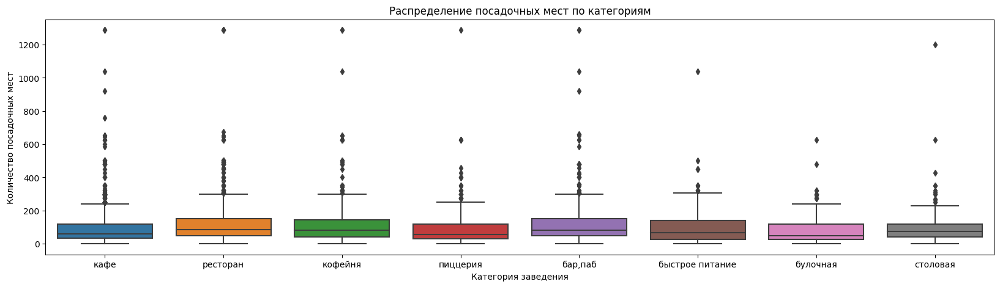

In [19]:
#построим диаграмму размаха
plt.figure(figsize = (20, 5))
sns.boxplot(data=moscow_places, x='category', y='seats')
plt.title('Распределение посадочных мест по категориям')
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория заведения')
plt.show()

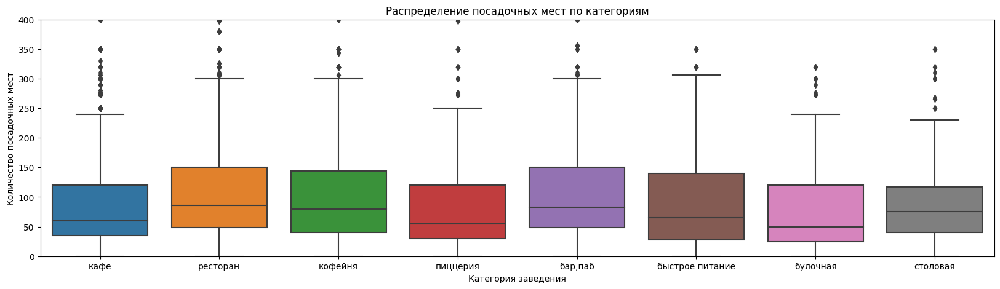

In [20]:
#построим диаграмму размаха
plt.figure(figsize = (20, 5))
sns.boxplot(data=moscow_places, x='category', y='seats')
plt.title('Распределение посадочных мест по категориям')
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категория заведения')
plt.ylim(0, 400)
plt.show()

Видим большие выбросы по посадочным местам (сомнительно выглядятзаведения с количеством посадочных бест более 400)
Поэтому обрежем выбросы и рассмотрим медиану посадочных мест завдений для категорий.

In [21]:
#Распределение посадочных мест по категориям
seats=(moscow_places.query('seats <= 400').groupby('category').agg({'seats':'median'})
       .sort_values(by='seats', ascending=False).reset_index())
(seats
 .style
 .hide_index()
 .format({'seats': '{:.2f}'})
.bar(color='lightgreen', vmin=0, subset=['seats'], align='zero')
 .set_caption('Распределение посадочных мест по категориям'))

category,seats
ресторан,83.00
"бар,паб",80.00
кофейня,75.00
столовая,75.00
быстрое питание,64.00
кафе,60.00
пиццерия,52.00
булочная,49.00


In [22]:
# строим столбчатую диаграмму 
fig = px.bar(seats.sort_values(by='seats', ascending=True), # загружаем данные и заново их сортируем
             x='seats', # указываем столбец с данными для оси X
             y='category',# указываем столбец с данными для оси Y
             color='category', #добавим цвет
             text='seats' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество посадочных мест объектов общественного питания по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория заведения',
                   legend_title='Категория')
fig.show() # выводим график

Рассмотрели количество посадочных мест объектов общественного питания по категориям:  
- больше всего посадочных мест в ресторанах, барах, столовых и кофейнях  
- меньше всего посадочных мест в пиццериях и булочных

### 3.3 Соотношение сетевых и несетевых заведений по количеству
<a id="Ratio_of_network"></a> 

In [23]:
#соберем таблицу сетевых заведений по категориям
chain = pd.pivot_table(moscow_places,
                       index=['chain', 'category'],
                       values=['name'],
                       aggfunc='count').reset_index()
#переименуем данные на сет/не сеть
chain['chain'] =chain['chain'].map(lambda x: 'сеть' if x==1 else 'не сеть')

#выдедем соотношение сетевых и не сетевых заведений
chain_all=chain.groupby('chain').sum().reset_index()
chain_all

,chain,name
0,не сеть,5198
1,сеть,3204


In [24]:
# строим столбчатую диаграмму 
fig = px.bar(chain_all.sort_values(by='name', ascending=False), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='chain', # указываем столбец с данными для оси Y
             color='chain', #добавим цвет
             text='name' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Количество сетевых и не сетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Отношение к сети',
                   legend_title='')
fig.show() # выводим график

In [25]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=chain_all['chain'], # указываем значения, которые появятся на метках сегментов
                             values=chain_all['name'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0.0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Доля сетевых и не сетевых заведений', # указываем заголовок графика
                  width=500, # указываем размеры графика
                  height=500,
                  annotations=[dict(x=1.3, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Отношение к сети',
                                    showarrow=False)])
fig.show() # выводим график

Рассмотрели соотношение сетевых и несетевых заведений в датасете (не сетевых заведений больше сетевых):
- не сетевых - 61,9% (5198) 
- сетевых - 38,1% (3204)

### 3.4 Соотношение сетевых и несетевых заведений по категориям
<a id="ratio_category"></a> 

In [26]:
#выведем таблицу распределения по сетям
chain.head()

,chain,category,name
0,не сеть,"бар,паб",596
1,не сеть,булочная,99
2,не сеть,быстрое питание,371
3,не сеть,кафе,1598
4,не сеть,кофейня,693


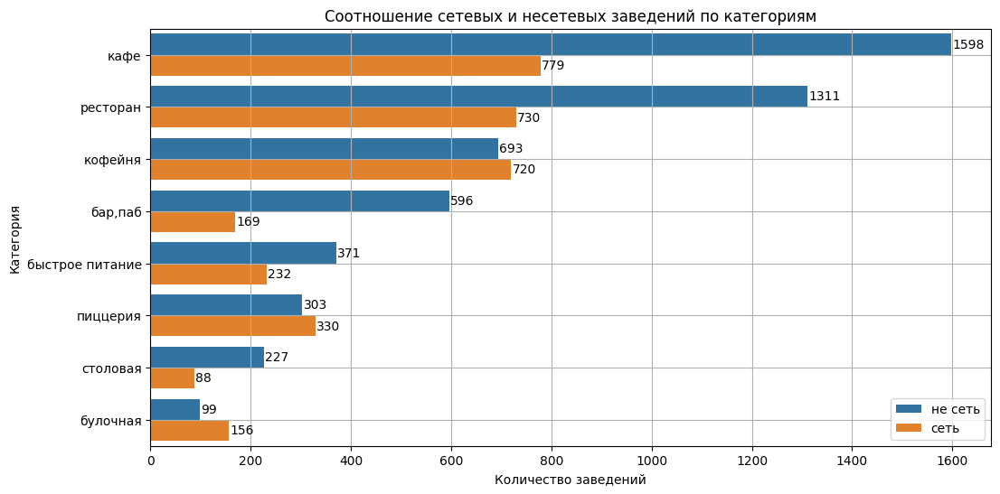

In [27]:
# назначаем размер графика
plt.figure(figsize=(12, 6))
# строим столбчатый график средствами seaborn
ax=sns.barplot(x='name', y='category', data=chain.sort_values(by='name', ascending=False), hue='chain')

#аннотация
for p in ax.patches:
    height = p.get_height() 
    width = p.get_width() 
    ax.text(x = width+2, 
    y = p.get_y()+(height/2), 
    s = '{:.0f}'.format(width),
    va = 'center')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Соотношение сетевых и несетевых заведений по категориям')
plt.xlabel('Количество заведений')
plt.ylabel('Категория')

# выбираем положение легенды и указываем размер шрифта
plt.legend(title='')
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [28]:
# выберем только сетевые заведения
chain_s=chain.query('chain == "сеть"')
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=chain_s['category'], # указываем значения, которые появятся на метках сегментов
                             values=chain_s['name'])]) # указываем данные, которые отобразятся на графике
fig.update_layout(title='Доля сетевых заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.2, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() # выводим график

Рассмотрели соотношение сетевых и несетевых заведений по категориям:
- чаще являются сетевыми заведения: кофейни, пиццерии и булочные
- среди сетей наиболее распространены: кафе, рестораны и кофейни  

### 3.5 Топ-15 популярных сетей в Москве
<a id="Top_15_popular_networks"></a> 

In [29]:
#Топ-15 популярных сетей в Москве
top_15=(moscow_places.query('chain == 1').groupby(['name', 'category']).agg({'chain':'count'})
       .sort_values(by='chain', ascending=False)).reset_index().rename(columns={'chain': 'count'}).head(15)
top_15

,name,category,count
0,шоколадница,кофейня,119
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,49
7,кофепорт,кофейня,42
8,кулинарная лавка братьев караваевых,кафе,39
9,теремок,ресторан,36


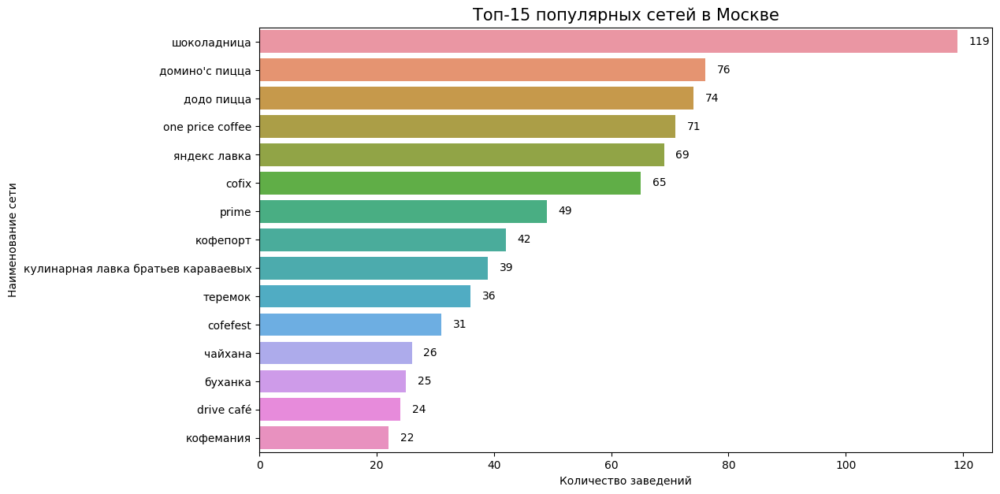

In [30]:
# назначаем размер графика
plt.figure(figsize=(12, 7))
# строим столбчатый график средствами seaborn
ax=sns.barplot(x='count', y='name', data=top_15)
   
#аннотация
for p in ax.patches:
    height = p.get_height() 
    width = p.get_width() 
    ax.text(x = width+2, 
    y = p.get_y()+(height/2), 
    s = '{:.0f}'.format(width),
    va = 'center')
         
# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Топ-15 популярных сетей в Москве', fontsize = 15)
plt.xlabel('Количество заведений')
plt.ylabel('Наименование сети')
# добавляем сетку
#plt.grid()
# отображаем график на экране
plt.show()

In [31]:
# Посмотрим категории для топа
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=top_15['category'], # указываем значения, которые появятся на метках сегментов
                             values=top_15['count'])]) # указываем данные, которые отобразятся на графике
fig.update_layout(title='Категории для топ-15', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.2, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() # выводим график

Самой распространенной сетью является "Шоколадница".
Топовой категорией среди популярных заведений является кофейня (45,6%), скорее всего это связано с простотой открытия и распространения по франшизе.

### 3.6 Распределение категорий заведений по административным районам Москвы
<a id="Distribution_of_categories"></a> 

In [32]:
#категории заведений по административным районы Москвы
category_district = pd.pivot_table(moscow_places,
                       index=['district', 'category'],
                       values=['name'],
                       aggfunc='count').reset_index()
#переименуем данные на АО
category_district['district'] =category_district['district'].str.replace("административный округ", "АО" )
category_district

,district,category,name
0,Восточный АО,"бар,паб",53
1,Восточный АО,булочная,25
2,Восточный АО,быстрое питание,71
3,Восточный АО,кафе,272
4,Восточный АО,кофейня,105
...,...,...,...
67,Южный АО,кафе,264
68,Южный АО,кофейня,131
69,Южный АО,пиццерия,73
70,Южный АО,ресторан,202


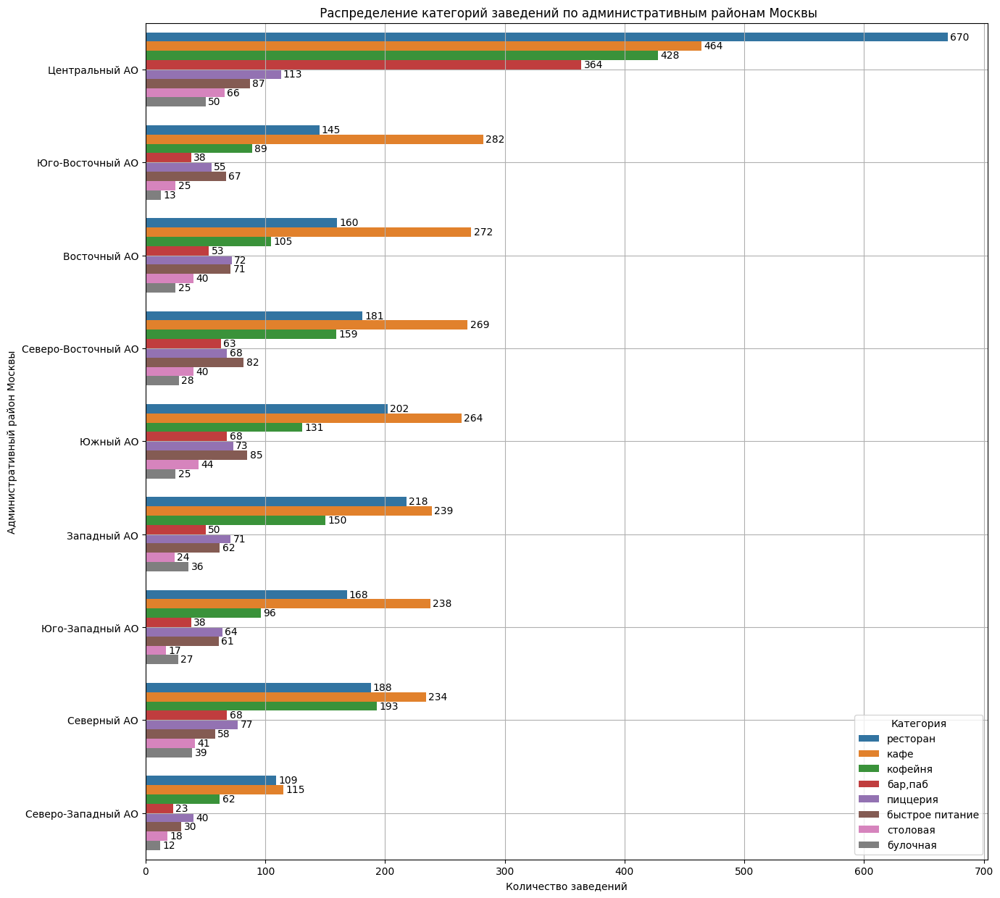

In [33]:
# назначаем размер графика
plt.figure(figsize=(15, 15))
# строим столбчатый график средствами seaborn
ax=sns.barplot(x='name', y='district', data=category_district.sort_values(by='name', ascending=False), hue='category')

#аннотация
for p in ax.patches:
    height = p.get_height() 
    width = p.get_width() 
    ax.text(x = width+2, 
    y = p.get_y()+(height/2), 
    s = '{:.0f}'.format(width),
    va = 'center')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title(' Распределение категорий заведений по административным районам Москвы')
plt.xlabel('Количество заведений')
plt.ylabel('Административный район Москвы')

# выбираем положение легенды и указываем размер шрифта
plt.legend(title='Категория')
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

В датасете представлены 9 административных округов Москвы: восточный, западный, северный, северо-восточный, северо-западный, центральный, юго-восточный, юго-западный и южный.  
Наибольшее количество заведений в Центральном АО, для него характерно большое количество ресторанов, в то время как для остальных округов наибольшее распространение характерно для кафе.


### 3.7 Распределение средних рейтингов по категориям заведений
<a id="Distribution_of_grades"></a> 

In [34]:
#распределение средних рейтингов по категориям заведений
category_rating = pd.pivot_table(moscow_places,
                       index=['category'],
                       values=['rating'],
                       aggfunc='mean').reset_index().sort_values(by='rating', ascending=False)
category_rating['rating']=round(category_rating['rating'], 2)
category_rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [35]:
# строим столбчатую диаграмму 
fig = px.bar(category_rating.sort_values(by='rating', ascending=False), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='rating', # указываем столбец с данными для оси Y
             color='category', #добавим цвет
             text='rating' # добавляем аргумент, который отобразит текст с информацией
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Категория',
                   yaxis_title='Средний рейтинг',
                   width=1000, # указываем размеры графика
                  height=500, 
                  showlegend=False)
fig.show() # выводим график

Средний рейтинг для всех категорий заведений практически на одном уровне и варьируется от 4,05 до 4,39.

### 3.8 Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района
<a id="average_rating_of_establishments"></a> 

Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson.

In [36]:
#средний рейтинг заведений каждого района
rating_district = round(moscow_places.groupby('district', as_index=False)['rating'].agg('mean')
                   .sort_values(by='rating', ascending=False), 2)
rating_district

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [37]:
# читаем файл и сохраняем в переменной
with open(r'admin_level_geomap.geojson', 'r', encoding='utf8') as f:
    geo_json = json.load(f)
# импортируем карту и хороплет
   
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Из картограммы видно, что средний рейтинг заведений для Центрального административного округа самый высокий. Самый низкий рейтинг заведений присущ Юго-Восточному административному округу.

### 3.9 Заведения датасета на карте
<a id="establishments_on_the_maps"></a> 

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [38]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places.apply(create_clusters, axis=1)

# выводим карту
m

### 3.10 Топ-15 улиц по количеству заведений
<a id="Top_15_streets"></a> 

In [39]:
#сгруппируем улицы по количеству заведений
street_group=(moscow_places.groupby('street').agg({'name':'count'})
              .sort_values(by='name', ascending=False)).reset_index().rename(columns={'name': 'count'})
street_group

,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
...,...,...
1442,островная улица,1
1443,отрадный проезд,1
1444,павелецкая набережная,1
1445,1-й балтийский переулок,1


In [40]:
#выделим топ-15 улиц
top_15_street_list = street_group['street'].head(15).unique()
display(top_15_street_list)
#Топ-15 улиц по количеству заведений с категориями
top_15_street=(moscow_places.query('street in @top_15_street_list').groupby(['street', 'category']).agg({'name':'count'})
       .sort_values(by='name', ascending=False)).reset_index().rename(columns={'name': 'count'})
top_15_street

array(['проспект мира', 'профсоюзная улица', 'проспект вернадского',
       'ленинский проспект', 'ленинградский проспект',
       'дмитровское шоссе', 'каширское шоссе', 'варшавское шоссе',
       'ленинградское шоссе', 'мкад', 'люблинская улица',
       'улица вавилова', 'кутузовский проспект', 'улица миклухо-маклая',
       'пятницкая улица'], dtype=object)

,street,category,count
0,проспект мира,кафе,53
1,мкад,кафе,45
2,проспект мира,ресторан,44
3,проспект мира,кофейня,36
4,профсоюзная улица,кафе,35
...,...,...,...
106,люблинская улица,пиццерия,1
107,проспект вернадского,булочная,1
108,мкад,столовая,1
109,кутузовский проспект,булочная,1


In [41]:
#код для графика
fig = px.bar(top_15_street.sort_values(by='count', ascending=False), x='street', y='count', 
             width = 900, height = 850, color='category')
fig.update_xaxes(tickangle=30)
fig.update_layout(
    title='Общее количество заведений и количество заведений каждой категории по улицам',
    xaxis_title="Название улицы",
    yaxis_title="Количество заведений",
    legend_title="Категория"
)
fig.update_traces( textfont_size = 10,  textangle = 0,  textposition = "outside" ,  cliponaxis = False ) 
fig.show() 

In [42]:
# создаём карту Москвы
point = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker_point(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(point)

# применяем функцию для создания маркера к записям датафрейма
moscow_places.query('street in @top_15_street_list').apply(create_marker_point, axis=1)
    
# выводим карту
point

Наибольшее количество заведений находится на проспекте Мира.  
Также на ТОП-15 улицах расположены торговые центры, в которых находится большое количество заведений.

### 3.11 Улицы с одним объектом общепита
<a id="Streets_with_one"></a> 

In [43]:
#выделим улицы с 1м заведением
one_street_list = street_group.loc[street_group['count'] == 1, 'street']
#кол-во улиц
display(one_street_list.nunique())

457

В датасете имеется информация о 457 улицах с одним заведением

In [44]:
one_street=(moscow_places.query('street in @one_street_list').groupby(['district', 'category']).agg({'street':'count'})
            .sort_values(by='street', ascending=False)
            .reset_index().rename(columns={'street': 'count'}))
one_street['district'] =one_street['district'].str.replace("административный округ", "АО" )
one_street

,district,category,count
0,Центральный АО,кафе,38
1,Центральный АО,ресторан,36
2,Центральный АО,кофейня,34
3,Центральный АО,"бар,паб",23
4,Южный АО,кафе,22
...,...,...,...
58,Южный АО,булочная,1
59,Западный АО,столовая,1
60,Северо-Западный АО,"бар,паб",1
61,Юго-Восточный АО,быстрое питание,1


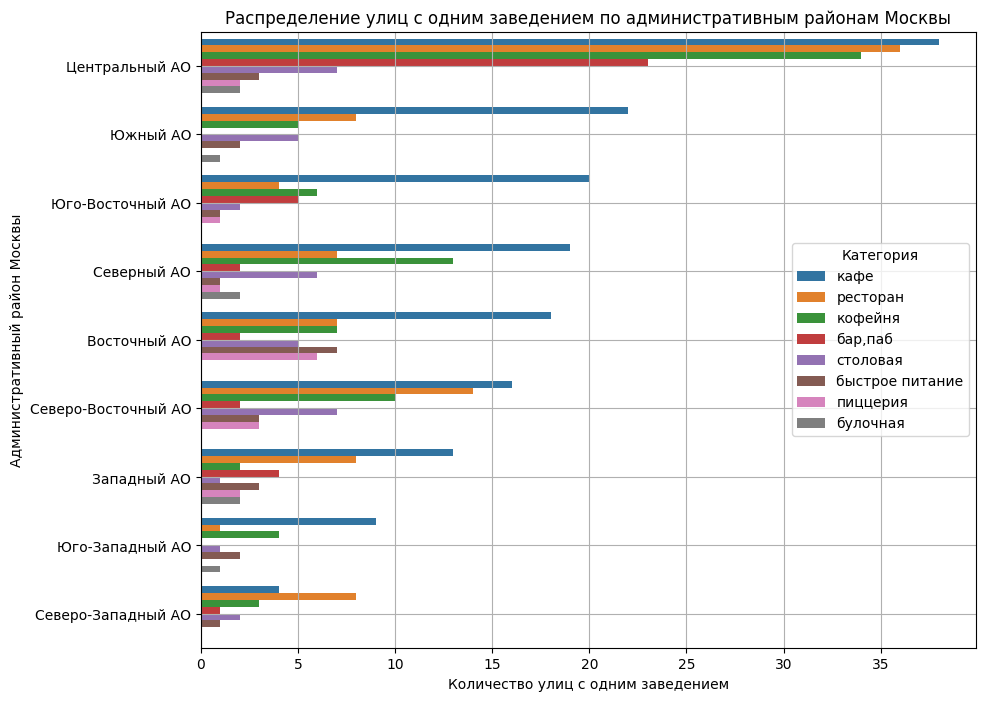

In [45]:
# назначаем размер графика
plt.figure(figsize=(10, 8))
# строим столбчатый график средствами seaborn
ax=sns.barplot(x='count', y='district', data=one_street, hue='category')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение улиц с одним заведением по административным районам Москвы')
plt.xlabel('Количество улиц с одним заведением')
plt.ylabel('Административный район Москвы')

# выбираем положение легенды и указываем размер шрифта
plt.legend(title='Категория')
# добавляем сетку
plt.grid()
# отображаем график на экране
plt.show()

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
k = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster_k = MarkerCluster().add_to(k)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_k(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_k)

# применяем функцию create_clusters() к каждой строке датафрейма
moscow_places.query('street in @one_street_list').apply(create_clusters_k, axis=1)

# выводим карту
k


В датасете имеется информация о 457 улицах с одним заведением.  
В основном такие улицы располагаются в Центральном административном округе (это может быть связано с наличием большого количества коротких улиц, что характерно для центральной части города). И лидерами по категориям являются кафе, рестораны и кофейни.  
Для остальных районов категория заведений расположенная на одной улице является - кафе.

### 3.12 Значения средних чеков заведений
<a id="Values_of_avg_receipts"></a> 

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. 

In [47]:
#Посчитаем медиану (т.к. есть выбросы) middle_avg_bill для каждого района
bill_district = (moscow_places.groupby('district', as_index=False)['middle_avg_bill'].agg('median')
                   .sort_values(by='middle_avg_bill', ascending=False))
bill_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [48]:
# создаём карту Москвы
bill = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средняя стоимость заказа по районам',
).add_to(bill)

# выводим карту
bill

Построили фоновую картограмму со значениями среднего чека для каждого района.
Наибольший средний чек характерен для Центрального и Западного административного округа
Средний чек больше зависит от района, а не от удаленности от центра.

### Вывод:
<a id="3_onclusion"></a> 
Рассмотрено количество объектов общественного питания по категориям:  
- больше всего представлено заведений таких как кафе (28,3%) и рестораны(24,3%)  
- меньше всего булочных (3,0%) и столовых (3,7%)

Рассмотрено количество посадочных мест объектов общественного питания по категориям:
- лидерами по количеству посадочных мест являются: рестораны, бары, столовые и кофейни
- меньше всего посадочных мест в пиццериях и булочных

Соотношение сетевых и несетевых заведений по количеству:
- не сетевых - 61,9% (5198)
- сетевых - 38,1% (3204)

Соотношение сетевых и несетевых заведений по категориям показывает, что чаще являются сетевыми заведения: кофейни, пиццерии и булочные. Среди сетей наиболее распространены: кафе, рестораны и кофейни.

Самой распространенной сетью является "Шоколадница".  
Топовой категорией среди сетевых заведений является кофейня (45,6%).

В датасете представлены 9 административных округов Москвы: восточный, западный, северный, северо-восточный, северо-западный, центральный, юго-восточный, юго-западный и южный.
Наибольшее количество заведений в Центральном АО, для него характерно большое количество ресторанов, в то время как для остальных округов наибольшее распространение характерно для кафе.

Средний рейтинг для всех категорий заведений практически на одном уровне и варьируется от 4,05 до 4,39.

Средний рейтинг заведений для Центрального административного округа самый высокий. Самый низкий рейтинг заведений присущ Юго-Восточному административному округу.

Рссмотрели Топ-15 улиц по количеству заведений:
- наибольшее количество заведений находится на проспекте Мира.
- на ТОП-15 улицах расположены торговые центры, в которых находится большое количество заведений, что могло повлиять на рейтинг.

В датасете имеется информация о 457 улицах с одним заведением. В основном такие улицы располагаются в Центральном административном округе (это может быть связано с наличием большого количества коротких улиц, что характерно для центральной части города). И лидерами по категориям являются кафе, рестораны и кофейни.  
В остальных районах для заведений расположенных на одной улице наиболее распространенной является категория - кафе.

Наибольший средний чек характерен для Центрального и Западного административного округа. Средний чек больше зависит от района, а не от удаленности от центра.




### 4. Исследование: открытие кофейни
<a id="open_of_coffee"></a> 
Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

In [49]:
#выведем датасет только с кофейнями
moscow_coffee = moscow_places.query('category == "кофейня"')
moscow_coffee.head()

,name,category,address,district,hours,is_24,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",False,55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",False,55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк левобережный
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,False,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,коровинское шоссе
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,False,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица маршала федоренко
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",False,55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица дыбенко


In [50]:
#количество кофеен
print('Всего кофеен в датасете:', moscow_coffee['name'].count())

Всего кофеен в датасете: 1413


Распределение кофеен по районам

In [51]:
#Посчитаем количество кофеен для каждого района
coffee_district = (moscow_coffee.groupby('district', as_index=False)['name'].agg('count')
                   .sort_values(by='name', ascending=False))

(coffee_district
 .style
 .hide_index()
 .bar(color='lightgreen', vmin=0, subset=['name'], align='zero')
 .set_caption('Распределение кофеен по районам'))

district,name
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,150
Южный административный округ,131
Восточный административный округ,105
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [52]:
# создаём карту Москвы
coffee = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee_district,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(coffee)

# выводим карту
coffee

Абсолютным лидером по количеству кофеен является Центральный административный округ (скорее всего это связано с большой проходимостью, наличием офисов и туристической зоны).   
Меньше всего кофеен в Северо-Западном административном округе.

Доля круглосуточных кофеен

In [53]:
#соберем таблицу круглосуточных кофеен
coffee_is_24 = pd.pivot_table(moscow_coffee,
                       index=['is_24'],
                       values=['name'],
                       aggfunc='count').reset_index()
#переименуем данные на круглосуточно/не круглосуточно
coffee_is_24['is_24'] =coffee_is_24['is_24'].map(lambda x: 'круглосуточно' if x==True else 'не круглосуточно')

#выдедем соотношение сетевых и не сетевых заведений
coffee_is_24


,is_24,name
0,не круглосуточно,1354
1,круглосуточно,59


In [54]:
# строим диаграмму с сегментами
fig = go.Figure(data=[go.Pie(labels=coffee_is_24['is_24'], # указываем значения, которые появятся на метках сегментов
                             values=coffee_is_24['name'], # указываем данные, которые отобразятся на графике
                             pull = [0.2, 0.0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Доля круглосуточных заведений', # указываем заголовок графика
                  width=600, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.3, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Режим работы',
                                    showarrow=False)])
fig.show() # выводим график

Доля круглосуточных кофеен составляет всего 4,18% (59 заведений)

Распределение рейтингов кофеен по районам?

In [55]:
#средний рейтинг заведений каждого района
coffee_rating_district = round(moscow_coffee.groupby('district', as_index=False)['rating'].agg('mean')
                   .sort_values(by='rating', ascending=False), 2)
coffee_rating_district

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


In [56]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
c_r = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee_rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(c_r)

# выводим карту
c_r

Высокий рейтинг кофеен характерен для Центрального и Северо-Западного административного округа. Нимменьший рейтинг в Северо-Восточном и  Заподном округах.  
В целом средний рейтинг мало отличается по показателям от 4,2 до 4,34.

Средняя стоимость чашки капучино по районам

In [57]:
#Посчитаем медиану middle_avg_bill для каждого района
moscow_coffee_cup = (moscow_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('median')
                   .sort_values(by='middle_coffee_cup', ascending=False))
moscow_coffee_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


In [58]:
# создаём карту Москвы
cup = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=moscow_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средняя стоимость заказа по районам',
).add_to(cup)
# выводим карту
cup

Для формировании цен на меню при открытии кофейни стоит ориентироваться на геолокацию. Но необходимо учесть возможные аномалии и выбросы: например на Западном и Юго-Западном АО мы можем видеть наличие аэропорта, где ценник будет сильно отличаться.

**Вывод:**

Всего кофеен в датасете: 1413

Абсолютным лидером по количеству кофеен является Центральный административный округ (скорее всего это связано с большой проходимостью, наличием офисов и туристической зоны). Меньше всего кофеен в Северо-Западном административном округе.

Доля круглосуточных кофеен составляет всего 4,18% (59 заведений)

Высокий рейтинг кофеен характерен для Центрального и Северо-Западного административного округа. Нимменьший рейтинг в Северо-Восточном и Заподном округах.
В целом средний рейтинг мало отличается по показателям от 4,2 до 4,34.

Для формировании цен на меню при открытии кофейни стоит ориентироваться на геолокацию, но необходимо учесть возможные аномалии и выбросы.

Выбор локации для открытия бизнеса - это совокупность многих факторов: конкуренция, поток людей и т.д.   
Есть смысл рассмотреть улицы с одним заведением в центральной части города, скорее всего хороший поток людей и малая конкуренция. С другой стороны может оказаться, что это далеко не лучшие места, от этого и малое количество заведений на этих улицах.  
В целом стоит ориентироваться на высокую проходимость (центр города, туристические маршруты, торговые центры).  

По результатам исследования была выполнена презентация: https://disk.yandex.ru/i/yTXJOnWce0XljQ